In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import mapclassify
from mpl_toolkits.basemap import Basemap
from matplotlib.colors import Normalize
from datetime import datetime
import plotly.express as px
import plotly.graph_objects as go

In [2]:
temperature = pd.read_csv('global_temp_data.csv', encoding='ISO-8859-1')
temperature.replace(to_replace=[-9999, -99], value=np.nan, inplace=True)
temperature.fillna(temperature.mean(), inplace=True)
temperature = temperature.round(2)

C:\Users\rache\AppData\Local\Temp\ipykernel_11184\153652791.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  temperature.fillna(temperature.mean(), inplace=True)


# New Section

In [3]:
temperature_numeric = temperature.select_dtypes(include=[np.number])
temperature_numeric = temperature_numeric[(temperature_numeric > -2) & (temperature_numeric < 2)]

In [4]:
temperature

,Continent,Country,Subregion,1945,1946,1947,1948,1949,1950,1951,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Africa,NaN,NaN,-0.02,0.11,0.29,-0.05,0.04,-0.32,-0.03,...,1.07,1.05,1.28,1.59,1.20,1.17,1.37,1.40,1.37,1.11
1,Africa,Algeria,NaN,0.23,0.27,0.68,0.11,0.00,-0.45,0.20,...,1.14,1.56,1.17,1.79,1.33,1.20,1.11,1.89,2.21,1.83
2,Africa,Angola,NaN,-0.16,0.13,0.00,-0.14,-0.02,-0.34,0.18,...,1.22,0.94,1.58,1.64,1.14,1.53,1.83,1.49,1.42,1.16
3,Africa,Benin,NaN,0.09,0.01,0.43,-0.07,0.41,-0.26,0.03,...,0.99,0.99,1.21,1.40,1.23,1.08,1.30,1.33,1.61,0.99
4,Africa,Burkina Faso,NaN,-0.10,-0.01,0.40,-0.04,0.34,-0.49,0.02,...,0.96,0.90,1.06,1.41,1.19,1.10,1.22,1.31,1.57,0.84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,Oceans,Mediterranean Sea,Aegean Sea,0.02,0.36,0.54,-0.23,-0.85,0.02,0.32,...,0.91,1.09,1.01,1.04,0.60,1.38,1.09,1.16,1.13,0.83
567,Oceans,Mediterranean Sea,Balearic,0.50,0.40,0.54,0.42,0.70,0.63,-0.27,...,0.74,1.23,1.51,1.42,1.66,1.41,1.13,1.49,1.27,2.13
568,Oceans,Mediterranean Sea,Black Sea,-0.28,0.01,0.59,-0.26,-1.04,-0.18,0.46,...,0.91,1.27,1.19,1.17,0.67,1.99,1.17,1.83,1.22,0.92
569,Oceans,Mediterranean Sea,Ligurian Sea,0.71,0.54,0.48,0.33,0.66,0.46,-0.03,...,0.85,1.35,1.85,1.24,1.22,1.85,1.52,1.56,1.47,2.22


In [5]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

In [6]:
temperature['name'] = temperature['Country'].str.title()
merged = world.merge(temperature, on='name')


In [7]:
melted = merged.melt(
    id_vars=['Continent', 'Country', 'Subregion', 'geometry'],
    var_name='year',
    value_name='temp_anomaly'
)

In [8]:
melted['temp_anomaly'] = pd.to_numeric(melted['temp_anomaly'], errors='coerce')

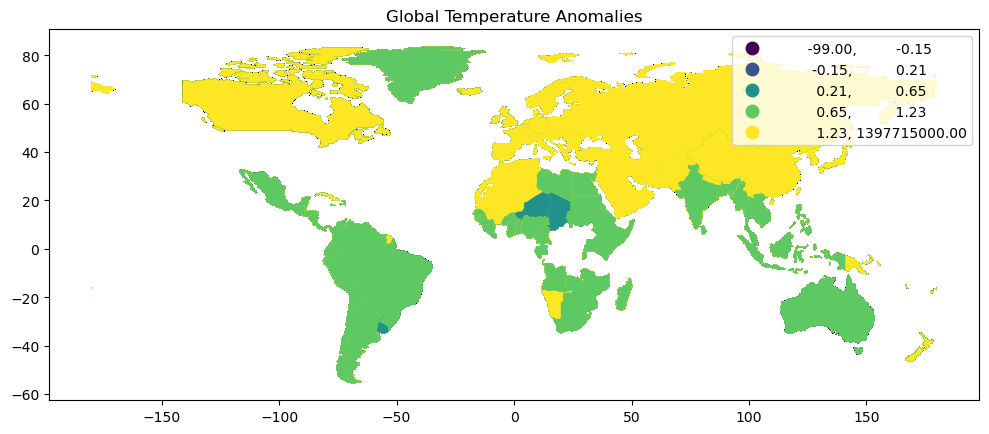

In [9]:
ax = melted.plot(column='temp_anomaly', cmap='viridis', figsize=(12, 10), scheme='quantiles', legend=True)
ax.set_title('Global Temperature Anomalies')
plt.show()

In [10]:
emperor = pd.read_csv('EmperorMigrationRough.csv')
emperor.loc[emperor["Identifier"] != "J91_2003_YK3_5845", "Identifier"] = "J91_2003_YK3_5845"
emperor

,Timestamp,Long,Lat,Name,Identifier
0,2003-08-03,-165.093,61.199,Chen canagica,J91_2003_YK3_5845
1,2003-08-03,-165.029,61.208,Chen canagica,J91_2003_YK3_5845
2,2003-08-03,-165.105,61.178,Chen canagica,J91_2003_YK3_5845
3,2003-08-03,-165.103,61.179,Chen canagica,J91_2003_YK3_5845
4,2003-08-03,-165.069,61.174,Chen canagica,J91_2003_YK3_5845
...,...,...,...,...,...
25106,2004-07-30,-165.122,61.178,Chen canagica,J91_2003_YK3_5845
25107,2004-07-30,-165.125,61.171,Chen canagica,J91_2003_YK3_5845
25108,2004-08-01,-165.130,61.188,Chen canagica,J91_2003_YK3_5845
25109,2004-08-01,-165.163,61.178,Chen canagica,J91_2003_YK3_5845


In [11]:
hawk = pd.read_csv('HawkMigrationRough.csv')
hawk.loc[hawk["Identifier"] != "71526a", "Identifier"] = "71526a"
print(hawk['Identifier'].unique())

['71526a']


In [12]:
puffin=pd.read_csv('PuffinMigrationRough.csv')
puffin.loc[puffin["Identifier"] != "z", "Identifier"] = 3
puffin

,Timestamp,Long,Lat,Name,Identifier
0,7/17/2007 0:00,-23.23,61.90,Fratercula arctica,3
1,7/17/2007 12:00,-21.34,61.47,Fratercula arctica,3
2,7/18/2007 0:00,-29.46,58.78,Fratercula arctica,3
3,7/18/2007 12:00,-23.07,55.89,Fratercula arctica,3
4,7/19/2007 12:00,-41.80,48.01,Fratercula arctica,3
...,...,...,...,...,...
6877,3/11/2008 0:00,-26.49,27.02,Fratercula arctica,3
6878,3/12/2008 0:00,-28.18,35.74,Fratercula arctica,3
6879,3/13/2008 0:00,-27.13,90.00,Fratercula arctica,3
6880,3/14/2008 0:00,-28.44,5.04,Fratercula arctica,3


In [13]:
herring=pd.read_csv('HerringMigrationRough.csv')
herring.loc[herring["Identifier"] != "z", "Identifier"] = 4
herring

,Timestamp,Long,Lat,Name,Identifier
0,2013-07-09,-81.80218,64.02047,Larus argentatus,4
1,2013-07-09,-81.79288,64.02810,Larus argentatus,4
2,2013-07-09,-81.78599,64.03082,Larus argentatus,4
3,2013-07-09,-81.80701,64.02631,Larus argentatus,4
4,2013-07-09,-81.79002,64.02982,Larus argentatus,4
...,...,...,...,...,...
28644,2015-02-11,-95.13139,29.09517,Larus argentatus,4
28645,2015-02-11,-95.14207,29.10082,Larus argentatus,4
28646,2015-02-11,-95.13523,29.09635,Larus argentatus,4
28647,2015-02-11,-95.12592,29.09681,Larus argentatus,4


In [14]:
birds = pd.concat([hawk.assign(source=1), emperor.assign(source=2), puffin.assign(source=3), herring.assign(source=4)], keys=[0, 1, 2, 3], ignore_index=True)
birds['Identifier'] = birds['Identifier'].replace({'71526a': 1, 'J91_2003_YK3_5845': 2})
birds

,Timestamp,Long,Lat,Name,Identifier,source
0,2008-10-23,-110.58270,42.05680,Aquila chrysaetos,1,1
1,2008-10-24,-110.58830,42.08230,Aquila chrysaetos,1,1
2,2008-10-24,-110.53310,42.55970,Aquila chrysaetos,1,1
3,2008-10-25,-110.79370,42.92370,Aquila chrysaetos,1,1
4,2008-10-27,-110.86480,43.08400,Aquila chrysaetos,1,1
...,...,...,...,...,...,...
84287,2015-02-11,-95.13139,29.09517,Larus argentatus,4,4
84288,2015-02-11,-95.14207,29.10082,Larus argentatus,4,4
84289,2015-02-11,-95.13523,29.09635,Larus argentatus,4,4
84290,2015-02-11,-95.12592,29.09681,Larus argentatus,4,4


In [15]:
birds['Timestamp'] = pd.to_datetime(birds['Timestamp'])
birds.sort_values('Timestamp', inplace=True)  # make sure data is sorted by time
opacity = birds['Timestamp'].dt.hour / 24  # calculate opacity values
print(opacity.min(), opacity.max())

0.0 0.5


In [16]:
# create a scatter mapbox plot
fig = px.scatter_mapbox(birds, lat="Lat", lon="Long", color="Identifier",
                        hover_name="Name", zoom=3, opacity=.1,
                        color_discrete_sequence=px.colors.qualitative.Dark24)

# update the layout with some customization options
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title="Bird sightings")
fig.update_layout(margin={"r":0,"t":30,"l":0,"b":0})

# show the plot

In [17]:
temperature = pd.read_csv('global_temp_data.csv', encoding='ISO-8859-1')
temperature.replace(to_replace=[-9999, -99], value=np.nan, inplace=True)
temperature.fillna(method='ffill', inplace=True)
temperature.fillna(method='bfill', inplace=True)
temperature = temperature.round(2)
temperature

,Continent,Country,Subregion,1945,1946,1947,1948,1949,1950,1951,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,Africa,Algeria,Anhui,-0.02,0.11,0.29,-0.05,0.04,-0.32,-0.03,...,1.07,1.05,1.28,1.59,1.20,1.17,1.37,1.40,1.37,1.11
1,Africa,Algeria,Anhui,0.23,0.27,0.68,0.11,0.00,-0.45,0.20,...,1.14,1.56,1.17,1.79,1.33,1.20,1.11,1.89,2.21,1.83
2,Africa,Angola,Anhui,-0.16,0.13,0.00,-0.14,-0.02,-0.34,0.18,...,1.22,0.94,1.58,1.64,1.14,1.53,1.83,1.49,1.42,1.16
3,Africa,Benin,Anhui,0.09,0.01,0.43,-0.07,0.41,-0.26,0.03,...,0.99,0.99,1.21,1.40,1.23,1.08,1.30,1.33,1.61,0.99
4,Africa,Burkina Faso,Anhui,-0.10,-0.01,0.40,-0.04,0.34,-0.49,0.02,...,0.96,0.90,1.06,1.41,1.19,1.10,1.22,1.31,1.57,0.84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
566,Oceans,Mediterranean Sea,Aegean Sea,0.02,0.36,0.54,-0.23,-0.85,0.02,0.32,...,0.91,1.09,1.01,1.04,0.60,1.38,1.09,1.16,1.13,0.83
567,Oceans,Mediterranean Sea,Balearic,0.50,0.40,0.54,0.42,0.70,0.63,-0.27,...,0.74,1.23,1.51,1.42,1.66,1.41,1.13,1.49,1.27,2.13
568,Oceans,Mediterranean Sea,Black Sea,-0.28,0.01,0.59,-0.26,-1.04,-0.18,0.46,...,0.91,1.27,1.19,1.17,0.67,1.99,1.17,1.83,1.22,0.92
569,Oceans,Mediterranean Sea,Ligurian Sea,0.71,0.54,0.48,0.33,0.66,0.46,-0.03,...,0.85,1.35,1.85,1.24,1.22,1.85,1.52,1.56,1.47,2.22
